<a href="https://colab.research.google.com/github/AmiAnurag/Chatbot/blob/main/DL_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'birdclef-2023:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F44224%2F5188730%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240509%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240509T180322Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D56f207df1b0003e69647d7566eb2f61e23ea3a7dab55612f1f93a7077cfc72eb74e10d8d5703fa5b9e375507a6aa69a56257215ecef9eade7ba26d7499bc5cc2f74afed3e6ebfee4488147768d5f813205f167718d7420cb39da6de1975086e179b37d310c58d3da351260c7fb92c337911a61b24542956bbf5f4d86b6212f0f72d248bdec66febbc7e170eeff69cb5608b36409a42a6e978a2828cefc6152eb952b1911923cf27514c0b9733d3c0726cc788a13b41993cb9bba8ca79c7afa61702848958ac29d930420c721634d38bd6c30f7af5aff38561c31c9d3cc5c30bc2fa0b5aed8bbf3504c487af59d6a4580ca638b6101d4136c8e0edaf3ac867049'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


# Bird Call Classification
## Why this project?
### Environmental Justification
Birds are at the top of food chain, hence monitoring them alone gives a decent picture of what is happening in the lower levels of the food chain. Birds are wonderful indicators of the habitat's quality. Now, it is easier to hear birds than see them. Hence, with proper bird sound detection and classification, researchers can bring up conclusions about an area's quality of life based on a chaging bird population.

### Deep Learning Justification
1. The task at hand is a perfect example of why Machine Learning is popular today. There is no other field or branch of science which can perform this task.
2. The data used is a wild dataset, deep learning works great for such dataset. The term "wild dataset" in the context of deep learning generally refers to datasets that are collected from real-world, diverse, and uncontrolled environments. These datasets are often contrasted with "controlled" datasets that are carefully curated or designed under specific conditions.

# Package Installation

In [ ]:
!pip install noisereduce

  Obtaining dependency information for noisereduce from https://files.pythonhosted.org/packages/f0/5e/d3c72f395b71d1bf513cfa5b990dd5421aa74de3670eaab53e51ae6ce401/noisereduce-3.0.2-py3-none-any.whl.metadata


---

# Libraries Required
Note: - The libraries are imported sequential, when they are required.

In [ ]:
import warnings # we don't want any warnings to show up
warnings.filterwarnings('ignore')
import numpy as np # linear algebra
import pandas as pd # data processing
import plotly.express as px # plotting graph
import matplotlib.pyplot as plt # display images
%matplotlib inline
import librosa # for audio loading
from IPython.display import Audio # for playback
from PIL import Image # for saving mel spectogram
import noisereduce as nr # background noise removal
from sklearn.preprocessing import LabelEncoder # we have text labels
from sklearn.model_selection import StratifiedKFold # cross-validation
import torch
import torchaudio # for loading audio
from torch.utils.data import Dataset, DataLoader # for managing dataset.
import torch.nn as nn # needed for super class reference.
import timm # "pyTorch Image Models", contains pre-trained models.
device = 'cuda' if torch.cuda.is_available() else 'cpu' # GPU availability.
from torch.optim import Adam # Adam Optimizer for G.D.
from tqdm import tqdm # for progress bar.
import torch.nn.functional as F
from sklearn.metrics import f1_score # metrics we need.
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
import seaborn as sns # templates for confusion matrix

---

# Metadata File Analysis
#### The dataset comes with audio clips and a metadata file, which contains various information about the audio.
#### Let's now look into the metadata file, and in next section we will take a look of audio files.

In [ ]:
df = pd.read_csv('/kaggle/input/birdclef-2023/train_metadata.csv')
df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


In [ ]:
print(f"Number of Samples: - {len(df)}")
print(f"Number of columns: - {len(df.columns)}")

columns = ""
for col in df.columns:
    columns = columns + col + ", "
columns = columns[:-2] # ignoring the last ", " characters.
print(f"Names of columns are: - {columns}")

Number of Samples: - 16941
Number of columns: - 12
Names of columns are: - primary_label, secondary_labels, type, latitude, longitude, scientific_name, common_name, author, license, rating, url, filename


In [ ]:
df.isnull().sum() # checking for null values

primary_label         0
secondary_labels      0
type                  0
latitude            227
longitude           227
scientific_name       0
common_name           0
author                0
license               0
rating                0
url                   0
filename              0
dtype: int64

In [ ]:
print(f"Number of classes: - {len(df.primary_label.value_counts())}")

Number of classes: - 264


### Observations
#### - There are 16941 bird audio samples.
#### - There are 12 columns describing a sample.
##### - The columns are: - primary_label, secondary_labels, type, latitude, longitude, scientific_name, common_name, author, license, rating, url and filename.
##### > ***primary_label*** gives the target label for the classification process. It also gives the shorthand name or species for the bird.
##### > ***type*** gives the bird sound type, for example, song, call etc.
##### > ***filename*** gives the relative path to the audio clip.
##### > Note! For the purpose of running a Deep Learning Classifier model the columns ***primary_label***, ***type*** and ***filename*** are sufficient.
#### - There are 264 unique birds in the dataset.
#### - Dataset contains some null values in columns *latitude* and *longitude*.

## Dataset Distributions
#### Let's try to look at how well the dataset is distributed based on columns ***primary_label*** and ***type***.

### 1. Species Count Distribution
#### This plot is based on column ***primary_label***. It will help us infer number of sample per target class.
#### Highlight from above observations, there 264 birds, hence 264 unique values in this column.

In [ ]:
class_count = df.primary_label.value_counts()

fig = px.bar(
    x=class_count.values, y=class_count.index,
    orientation='h', height=1000,
    title="Species Count Distribution"
)
fig.update_layout(xaxis_title="Count", yaxis_title="Label")
fig.show()

### Observations from Species Count Distribution
#### - There are 16941 bird audio samples.
#### - There are 264 unique birds in the dataset.
#### - Certain species have only 1 audio recoding and some have 500 audio recording. Remain birds have number of samples between 1 and 500.
#### - The dataset is ***heavily imbalanced*** with regard to column ***primary_label***.

### 2. Sound Type Count Distribution
#### This plot is based on column ***type***. It will help us infer number of sample per sound type.
#### What is sound type?
##### Sound type denotes various sounds produced by the bird in the given audio clip.
#### What are the various sounds produced by the bird?
##### Birds can make lot's of sound. For example they can singing ***song***, or make ***call*** to other birds, or ***peck*** some wood, or even ***wingflaps***.
#### Let's take a look at how many such sound samples are available per ***type***.

In [ ]:
type_labels = sum([eval(x) for x in df.type], [])
type_counts = pd.value_counts(type_labels)

fig = px.bar(
    x=type_counts.values, y=[
        f'{" ".join(x.split(" ")[:3])} ...'
        if len(x.split(" ")) > 3 else x
        for x in type_counts.index
    ],
    orientation='h', height=1000,
    title="Sound Type Count Distribution"
)
fig.update_layout(xaxis_title="Count", yaxis_title="Audio type")
fig.show()

class_count = df.primary_label.value_counts()

### Observations from Sound Type Count Distribution
#### - There are 6808 samples which contain bird calls.
#### - There are 6411 samples which contain bird songs.
#### - Note! An audio clip can contain multiple type of bird sounds.
#### - The dataset is ***heavily imbalanced*** with regards to column ***type***.

--------------------

# Audio Analysis

#### Let's us do some exploration with regards to audio clips and try to get some analysis.
#### Let's define a helper function ***audio_analysis*** which will: play the audio, give its waveform and print its Mel Spectogram

In [ ]:
def audio_analysis(filename, noise_remove=False):
    """
    Input:
    filename - contains the path to audio file.
    noise_remove - should the background noise be removed. By default background noise is not removed.

    Output: -
    Audio playback - Gives a player manager for audio.
    Waveform
    Mel Spectogram
    """

    # Loading Audio
    samples, sample_rate = librosa.load(filename)

    # Removing Noise
    if(noise_remove):
        samples = nr.reduce_noise(y=samples, sr=sample_rate)

    # Audio playback
    print("\nClick the play button to play the audio clip.\n")
    display(Audio(samples, rate=sample_rate))

    # Displaying Waveform
    plt.figure(figsize=(10,5))
    librosa.display.waveshow(samples, sr=sample_rate)
    plt.title("Waveform Graph")

    # Displaying Mel Spectogram
    plt.figure(figsize=(5,4))
    mel = librosa.feature.melspectrogram(y=samples, sr=sample_rate, n_mels=128, fmax=8000)
    librosa.display.specshow(librosa.power_to_db(mel, ref=np.max),
                            y_axis='mel', fmax=8000, x_axis='time')
    plt.title('Mel Spectrogram')
    plt.colorbar(format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

#### Let's try to look at a sample from bird class called ***barswa***.

In [ ]:
df[df.filename=="barswa/XC113914.ogg"]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
895,barswa,[],"['call', 'flight call']",46.4605,6.3914,Hirundo rustica,Barn Swallow,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/113914,barswa/XC113914.ogg



Click the play button to play the audio clip.



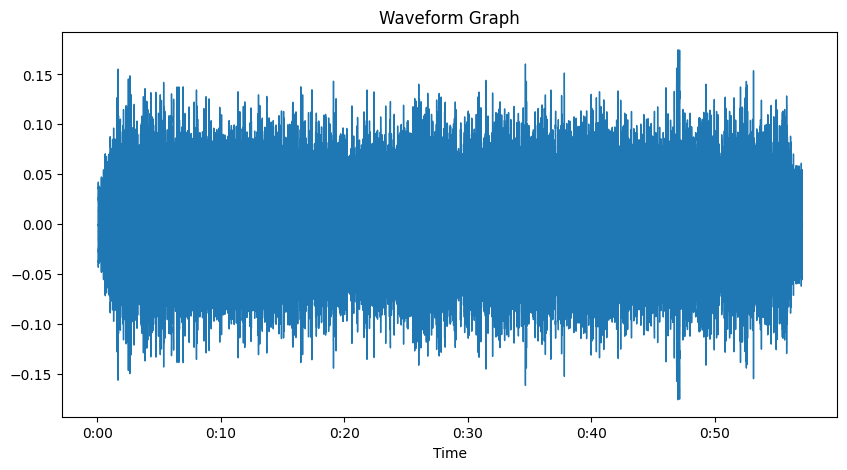

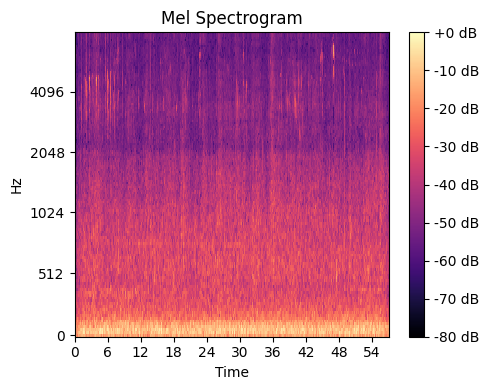

In [ ]:
audio_analysis("/kaggle/input/birdclef-2023/train_audio/barswa/XC113914.ogg")

### Observation
#### - We can see that the above waveform is filled with background noises, evident in the audio playback.
#### - This is serious problem. Hence let's try to remove the noise.



Click the play button to play the audio clip.



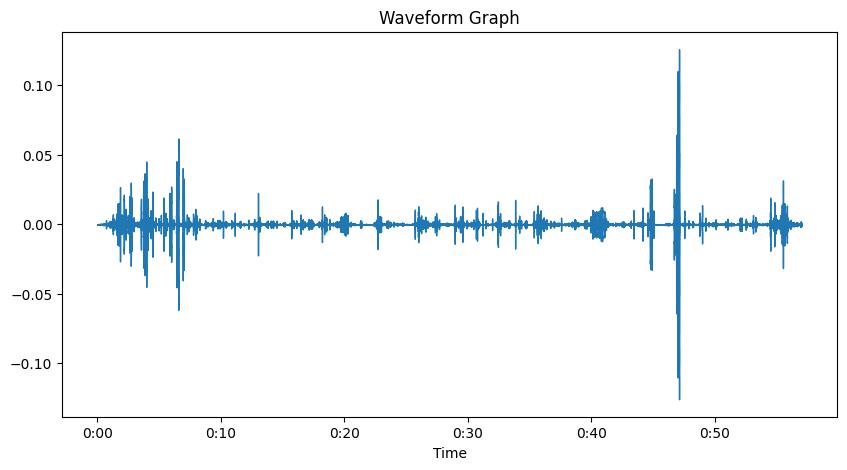

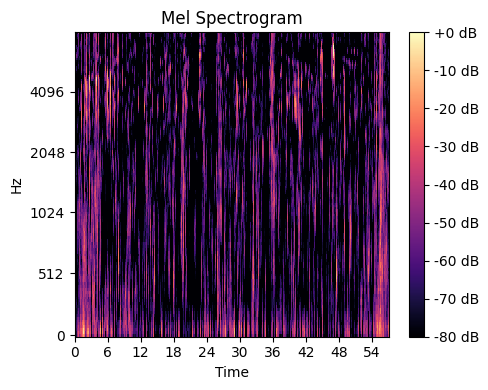

In [ ]:
audio_analysis("/kaggle/input/birdclef-2023/train_audio/barswa/XC113914.ogg", noise_remove=True)

### Observation
#### The new waveform looks much better, with regards to noise.
#### The noise reduction is also evident from audio playback.

#### Looking at another bird class called ***afpkin1***.

In [ ]:
df[df.filename=="afpkin1/XC704863.ogg"]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
577,afpkin1,[],[''],-6.076558,37.559272,Ispidina picta,African Pygmy Kingfisher,Louis A. Hansen,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/704863,afpkin1/XC704863.ogg



Click the play button to play the audio clip.



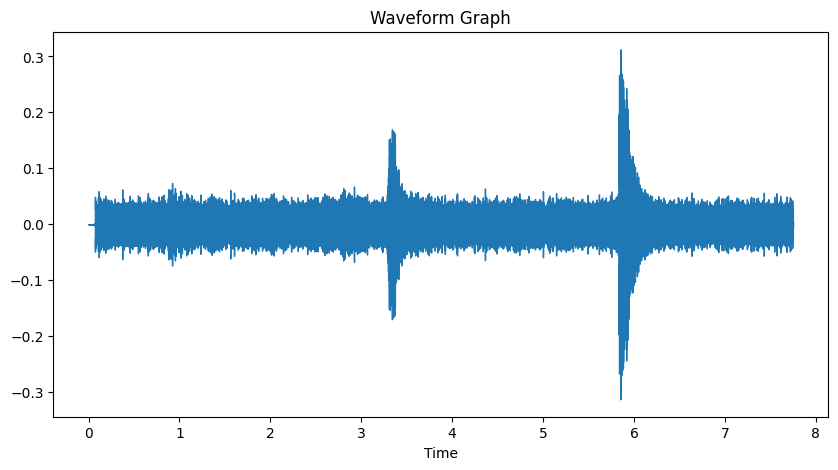

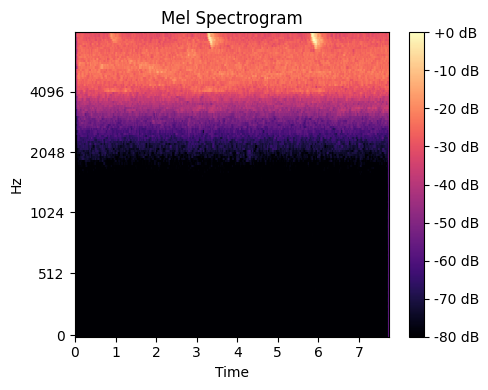

In [ ]:
audio_analysis("/kaggle/input/birdclef-2023/train_audio/afpkin1/XC704863.ogg")

#### Let's remove the background noise.


Click the play button to play the audio clip.



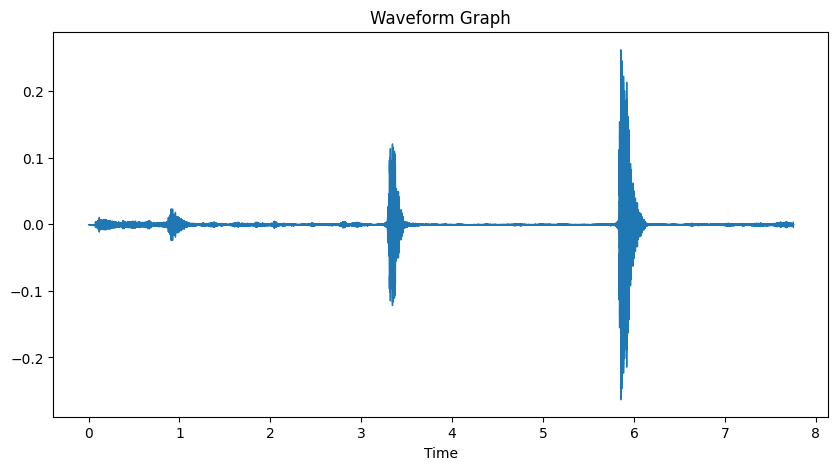

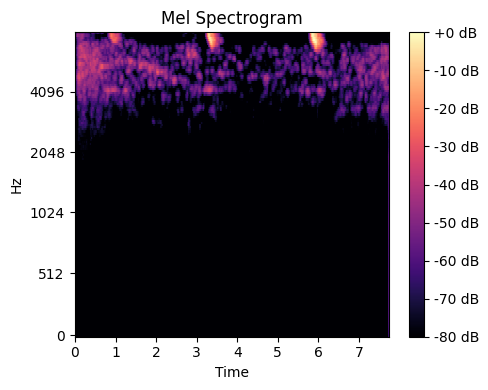

In [ ]:
audio_analysis("/kaggle/input/birdclef-2023/train_audio/afpkin1/XC704863.ogg", noise_remove=True)

#### For one last time, let's look at another bird class called ***afrgos1***.

In [ ]:
df[df.filename=="afrgos1/XC123946.ogg"]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
663,afrgos1,[],['flight call'],-7.8805,36.0267,Accipiter tachiro,African Goshawk,Louis A. Hansen,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://www.xeno-canto.org/123946,afrgos1/XC123946.ogg



Click the play button to play the audio clip.



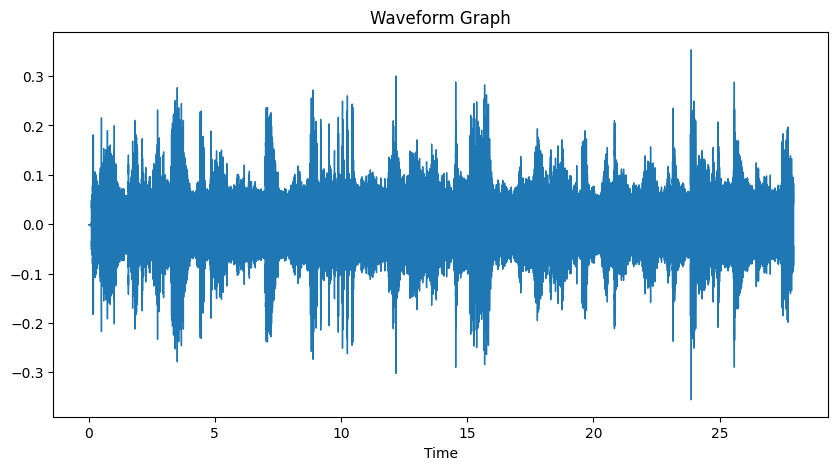

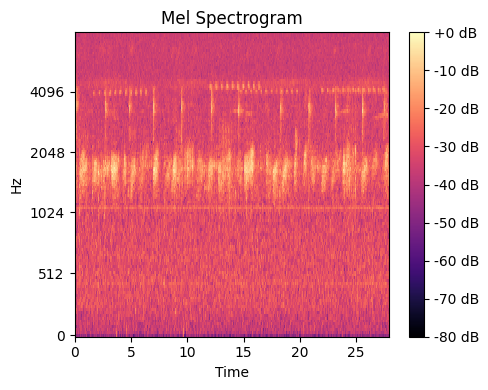

In [ ]:
audio_analysis("/kaggle/input/birdclef-2023/train_audio/afrgos1/XC123946.ogg")


Click the play button to play the audio clip.



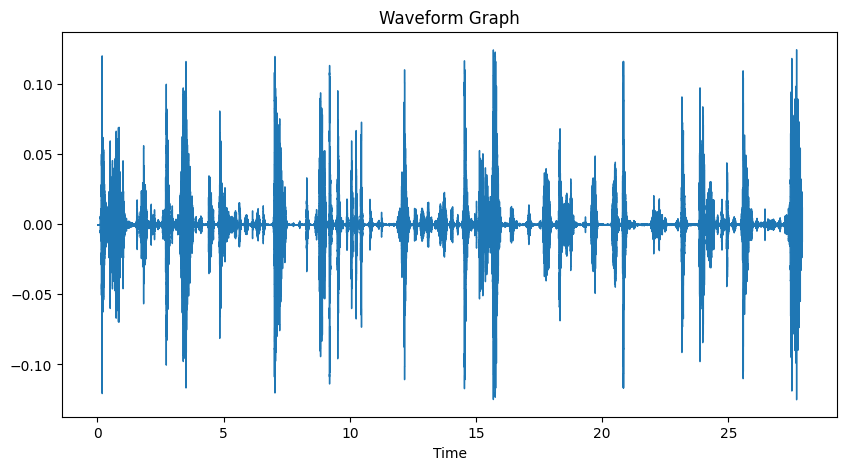

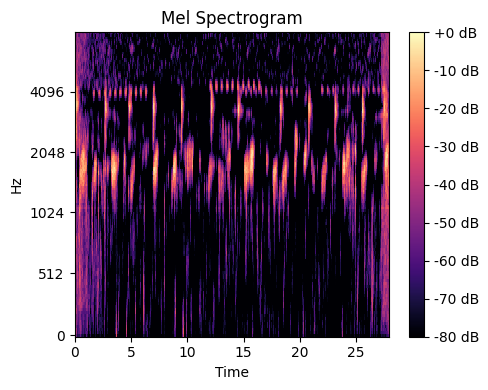

In [ ]:
audio_analysis("/kaggle/input/birdclef-2023/train_audio/afrgos1/XC123946.ogg", noise_remove=True)

### Observations From Above Three Audio Clips
#### - Each Audio clip is of **varying** length.
#### - We don't know at what **timestamp** the bird makes sound.
#### - Audio includes **noises** from other animals as well. This is can be removed to a certain extent only, beyond which nothing can be done.
#### - Pointing out in specific,
##### -> the first sample contains the bird sound with some random noise added, which was not removed by SOTA noise reducer(its fault)
##### -> the second sample is the ***ideal*** one, which just contains the bird sound
##### -> the third sample contains lot of noises, which includes other animals as well, cannot blame on SOTA noise reducer, nothing can be done :(

----

# Issues found from Analysis
#### 1. Some data samples contain ***null entries***.
#### 2. The dataset is ***heavily imbalanced*** with regards to columns, *type* and *primary_label*.
#### 3. Each audio clip is of ***varying length***, due to which we will get different length spectogram.
#### 4. We need to make an educate crop, because we don't know the ***timestamp*** of where the bird is making the noise.
#### 5. Deal with various kinds of ***noise*** present in the audio, since they drastically affect the spectogram.

---

# Sampling

In [ ]:
df = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv")
df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


## Removing Some Columns

In [ ]:
df = df.drop(["secondary_labels", "latitude", "longitude", "common_name", "license", "rating", "scientific_name", "url", "author"], axis=1)
df.head()

,primary_label,type,filename
0,abethr1,['song'],abethr1/XC128013.ogg
1,abethr1,['call'],abethr1/XC363501.ogg
2,abethr1,['song'],abethr1/XC363502.ogg
3,abethr1,['song'],abethr1/XC363503.ogg
4,abethr1,"['call', 'song']",abethr1/XC363504.ogg


## Sampling on *type* column
#### As mentioned before, the type column makes the dataset unbalanced. To fix this, let's restrict our samples to type="\*calls\*"(denotes regex), i.e., we will only take bird samples that contains calls.
#### Note! There are different kinds of call, to name a few, *alarm call*, *two-note call*, *call* itself, etc. We will be taking all these.

In [ ]:
# filtering only bird sounds of type call.
for i in range(len(df)):
    if "call" not in df.loc[i, "type"]:
        df.loc[i, "type"] = np.nan

df.head()

,primary_label,type,filename
0,abethr1,NaN,abethr1/XC128013.ogg
1,abethr1,['call'],abethr1/XC363501.ogg
2,abethr1,NaN,abethr1/XC363502.ogg
3,abethr1,NaN,abethr1/XC363503.ogg
4,abethr1,"['call', 'song']",abethr1/XC363504.ogg


In [ ]:
df = df.dropna().reset_index(drop=True)
print(df.count())
print()
df.head()

primary_label    9405
type             9405
filename         9405
dtype: int64



,primary_label,type,filename
0,abethr1,['call'],abethr1/XC363501.ogg
1,abethr1,"['call', 'song']",abethr1/XC363504.ogg
2,abethr1,"['call', 'song']",abethr1/XC432639.ogg
3,abethr1,"['adult', 'call', 'sex uncertain', 'song']",abethr1/XC639039.ogg
4,abhori1,"['call', 'song']",abhori1/XC120250.ogg


### Observation
#### The newly sampled clips, will also contain other ***type*** values like songs, adult etc.
#### From here on will work with bird call identification alone.
Note: We no longer the column type, hence we can remove it.

In [ ]:
df = df.drop(['type'], axis=1)
df.head()

,primary_label,filename
0,abethr1,abethr1/XC363501.ogg
1,abethr1,abethr1/XC363504.ogg
2,abethr1,abethr1/XC432639.ogg
3,abethr1,abethr1/XC639039.ogg
4,abhori1,abhori1/XC120250.ogg


## Sampling on *primary_label* column
#### The primary_label column also makes the dataset unbalanced.
#### To resolve this issue, we will take only few classes which contains samples greater than a certain threshold, 300.  

In [ ]:
# picking the birds with most samples; birds with samples > 300.
df.primary_label.value_counts().sort_values()[-10:]

primary_label
greegr     226
blakit1    227
litegr     317
barswa     323
cohmar1    328
eubeat1    350
eaywag1    362
woosan     381
comsan     411
combuz1    425
Name: count, dtype: int64

In [ ]:
# taking only the last 8 species in the sorted df.
species = ["combuz1", "comsan", "woosan", "eaywag1", "eubeat1", "cohmar1", "barswa", "litegr"]

for i in range(len(df)):
    if df.loc[i, "primary_label"] not in species:
        df.loc[i, "primary_label"] = np.nan

df = df.dropna().reset_index(drop=True)
print(f"New samples count: - \n{df.count()}\n")
df.head()

New samples count: - 
primary_label    2897
filename         2897
dtype: int64



,primary_label,filename
0,barswa,barswa/XC113914.ogg
1,barswa,barswa/XC133096.ogg
2,barswa,barswa/XC135474.ogg
3,barswa,barswa/XC139171.ogg
4,barswa,barswa/XC141346.ogg


#### Some classes have more than 300 samples. But, it would be best when number of samples are sample across all classes.

In [ ]:
combuz1 = df.loc[(df['primary_label'] == 'combuz1')]
comsan = df.loc[(df['primary_label'] == 'comsan')]
woosan = df.loc[(df['primary_label'] == 'woosan')]
eaywag1 = df.loc[(df['primary_label'] == 'eaywag1')]
eubeat1 = df.loc[(df['primary_label'] == 'eubeat1')]
cohmar1 = df.loc[(df['primary_label'] == 'cohmar1')]
barswa = df.loc[(df['primary_label'] == 'barswa')]
litegr = df.loc[(df['primary_label'] == 'litegr')]

combuz1 = combuz1.sample(frac=1).reset_index(drop=True).head(300)
comsan = comsan.sample(frac=1).reset_index(drop=True).head(300)
woosan = woosan.sample(frac=1).reset_index(drop=True).head(300)
eaywag1 = eaywag1.sample(frac=1).reset_index(drop=True).head(300)
eubeat1 = eubeat1.sample(frac=1).reset_index(drop=True).head(300)
cohmar1 = cohmar1.sample(frac=1).reset_index(drop=True).head(300)
barswa = barswa.sample(frac=1).reset_index(drop=True).head(300)
litegr = litegr.sample(frac=1).reset_index(drop=True).head(300)

df = pd.concat([combuz1, comsan, woosan, eaywag1, eubeat1, cohmar1, barswa, litegr], ignore_index=True, axis=0)
df.count()

primary_label    2400
filename         2400
dtype: int64

In [ ]:
df.head()

,primary_label,filename
0,combuz1,combuz1/XC667008.ogg
1,combuz1,combuz1/XC690064.ogg
2,combuz1,combuz1/XC240250.ogg
3,combuz1,combuz1/XC511685.ogg
4,combuz1,combuz1/XC583384.ogg


### Checkpoint
#### We resolved the null values and imbalanced dataset.  

In [ ]:
class_count = df.primary_label.value_counts()

fig = px.bar(
    x=class_count.values, y=class_count.index,
    orientation='h', height=400, width=600,
    title="Species Count Distribution"
)
fig.update_layout(xaxis_title="Count", yaxis_title="Label")
fig.show()

#### Now, the labels are given as string, but AI models only work with numbers, hence we will have to encode them.

In [ ]:
# adding a new column which contains the numeric labels.
encoder = LabelEncoder()
df['primary_label_encoded'] = encoder.fit_transform(df['primary_label'])
df.head()

,primary_label,filename,primary_label_encoded
0,combuz1,combuz1/XC667008.ogg,2
1,combuz1,combuz1/XC690064.ogg,2
2,combuz1,combuz1/XC240250.ogg,2
3,combuz1,combuz1/XC511685.ogg,2
4,combuz1,combuz1/XC583384.ogg,2


In [ ]:
# Num_classes
print(f"Number of classes: {len(df.primary_label_encoded.unique())}")
print(f"Classes are: - \n{df.primary_label.unique()}")

Number of classes: 8
Classes are: - 
['combuz1' 'comsan' 'woosan' 'eaywag1' 'eubeat1' 'cohmar1' 'barswa'
 'litegr']


### Test-Train Split

In [ ]:
# shuffling the dataframe.
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,primary_label,filename,primary_label_encoded
0,comsan,comsan/XC664399.ogg,3
1,combuz1,combuz1/XC628927.ogg,2
2,litegr,litegr/XC481452.ogg,6
3,barswa,barswa/XC349298.ogg,0
4,woosan,woosan/XC496526.ogg,7


In [ ]:
# splitting training and testing datasets.
df_total = df
df_training = df_total[:2100] # split being 80:20 for training:testing
df_testing = df_total[2100:]
df = df_training

### K-fold cross validation

In [ ]:
skf = StratifiedKFold(n_splits=5)
for k, (_, val_ind) in enumerate(skf.split(X=df, y=df['primary_label_encoded'])):
    df.loc[val_ind, 'kfold'] = k

df.head()

,primary_label,filename,primary_label_encoded,kfold
0,comsan,comsan/XC664399.ogg,3,0.0
1,combuz1,combuz1/XC628927.ogg,2,0.0
2,litegr,litegr/XC481452.ogg,6,0.0
3,barswa,barswa/XC349298.ogg,0,0.0
4,woosan,woosan/XC496526.ogg,7,0.0


In [ ]:
# shuffling the dataset
df = df.sample(frac=1).reset_index(drop=True)
df

,primary_label,filename,primary_label_encoded,kfold
0,woosan,woosan/XC662168.ogg,7,1.0
1,litegr,litegr/XC335944.ogg,6,3.0
2,woosan,woosan/XC687199.ogg,7,1.0
3,barswa,barswa/XC147199.ogg,0,4.0
4,comsan,comsan/XC266358.ogg,3,2.0
...,...,...,...,...
2095,combuz1,combuz1/XC433308.ogg,2,0.0
2096,woosan,woosan/XC496525.ogg,7,2.0
2097,combuz1,combuz1/XC627885.ogg,2,2.0
2098,litegr,litegr/XC576959.ogg,6,3.0


# Configurations

In [ ]:
CONFIG = {"epochs": 10, # n passes over the entire data.
          "num_classes": 8, # number of unique bird species.
          "batch_size": 8, # update the parameters after running through n samples.
          "sample_rate": 32_000, # high sampling rate => high resolution
          "hop_length": 512, # distance between consecutive FFTs.
          "n_mels": 224, # number of mel bins. Frequency(y-axis) is split into mel bins.
          "n_fft": 1024, # number of data points used in each discrete Fourier transform.
          "pad_length": 4, # amount of empty sound to be added for one end, keep it as integers.
          "crop_length": 4 # length of audio to crop for one end, keep it as integers.
         }
#
# Note!
# pad length and crop length are from a point and along a direction.
# Eg. let audio clip be 25seconds, and let pad_length be 5 seconds. We then pad 5 seconds
# on either end of clip, hence audio becomes 35seconds long.
# Say, we a pick a timestep 20 and our crop_length = 5. Now our window becomes [15,25],
# we cropped 5 seconds from either side.

# Audio Processing for Model
## Operations Performed
#### 1. Load the audio.
#### 2. Convert the audio from stereo to mono.
#### 3. Resample it to target sample rate.
#### 4. Pad the audio.
#### 5. Crop the audio.
#### 6. Remove background noise.
#### 7. Convert to mel spectogram.
#### 8. Convert to RGB.
#### 9. Get the label of image.

## FAQ on Audio Processing
### Why should we convert from stereo to mono?
For consistency, compatibility and less resource consumption.

### Why should we resample the image?
Sample rate means number of sample per second. This affects spectogram. All audio clips should have same sample rate for consistency.

### Why pad and crop the audio?
Different samples have different audio length, which affects the size of spectogram. And CNN architecture require fixed size input. This requires all the samples to have same length. In our case we will have the legth as 10seconds(crop_length * 2). But we need to address the corner case where the length of the audio clip is less than window size. Hence we pad pad_length seconds to either ends of the audio clip.

### How to crop the audio?
We dicussed this issue above, saying we don't know where to crop the audio. Since the bird sound can be present at any timestamp. To overcome this issue we have to make an assumption that, in the clip bird's sound will have the amplitude, and its neighbourhood will have more of its sound, hence take crop_length seconds from left and right of this point as sample. And it is also certain that first and last 5 seconds of the audio will not contain this peak amplitude, since we padded 0tensors at either end, hence when cropping we never run into a case where we go beyond either ends of audio clip.  

In [ ]:
class BirdCLEFDataset(Dataset):
    def __init__(self, df, target_sample_rate=CONFIG["sample_rate"], max_time=5, image_transforms=None):

        self.file_paths = df['filename'].values # holds the path for audio.
        self.labels = df['primary_label_encoded'].values # holds the label of that audio.
        self.target_sample_rate = target_sample_rate
        self.image_transforms = image_transforms # if any transform was provided then use it.

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, index):
        """
        Input - index of element.
        Output - image, label.
        """

        # 1. Load the audio
        filepath = f'/kaggle/input/birdclef-2023/train_audio/{self.file_paths[index]}'
        audio, sample_rate = torchaudio.load(filepath)


        # 2. Convert the audio from stereo to mono
        audio = self.to_mono(audio)


        # 3. Resample it to target sample rate
        if sample_rate != self.target_sample_rate:
            resample = Resample(sample_rate, self.target_sample_rate)
            audio = resample(audio)


        # 4. Pad the audio.
        audio = self.pad_audio(audio)


        # 5. Crop the audio.
        audio = self.crop_audio(audio)


        # 6. Remove background noise
        audio = torch.from_numpy(nr.reduce_noise(y=audio, sr=self.target_sample_rate))


        # 7. Convert to Mel Spectogram
        mel_spectogram = torchaudio.transforms.MelSpectrogram(sample_rate=self.target_sample_rate,
                                        n_mels=CONFIG['n_mels'],
                                        n_fft=CONFIG['n_fft'])
        mel = mel_spectogram(audio)


        # 8. Convert image to RGB
        image = torch.stack([mel, mel, mel])

        # 9. Get the label for image
        label = torch.tensor(self.labels[index])

        return image, label


    def pad_audio(self, audio):

        pad_length = CONFIG["pad_length"]
        pad_sample = self.target_sample_rate * pad_length
        pad_tensor = torch.zeros(pad_sample)

        # padding both ends of audio with 0s.
        audio = torch.cat((pad_tensor, audio, pad_tensor))
        return audio


    def crop_audio(self, audio):

        crop_length = CONFIG["crop_length"]
        crop_sample = self.target_sample_rate * crop_length

        # finding the peak amplitude
        peak_index = torch.argmax(audio).item()

        # cropping 5seconds (left and right) from that point
        return audio[peak_index-crop_sample : peak_index+crop_sample]


    def to_mono(self, audio):
        return torch.mean(audio, axis=0)

# Model Definition

## Model used is ***EfficientNet***.
### Why CNN architecutre over RNN architecture?
#### > The given audio data is naturally represented in time-frequency making it suitable for spectogram representation.
#### > The current task of classification is simple, hence a well designed CNN would suffice, RNN outperforms CNN only when there are long-term dependencies.
#### > Computationlly CNNs better than RNNs.
##### ***CNNs have proven to be highly effective for extracting spatial features from audio signals, making them suitable for tasks such as music genre classification and environmental sound classification. The remarkable success of CNNs in this field is due to their ability to capture high-level features from the audio data. RNNs are particularly well-suited for tasks that require temporal dependencies, such as speech classification and audio-sequence classification.*** <br>-[K. Zaman et al.: Survey of Audio Classification Using Deep Learning](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=10258355)




### Why EfficientNet?
#### The below plots will explain it all.
![](https://raw.githubusercontent.com/tensorflow/tpu/master/models/official/efficientnet/g3doc/flops.png)
FLOPS - Floating Point Operations Per Second.

---
![](https://raw.githubusercontent.com/tensorflow/tpu/master/models/official/efficientnet/g3doc/params.png)

#### It clearly outperforms all other popular classification models. And, it has fewer computations than others.
#### Efficientnet models are also very suitable for wild dataset for the reasons mentioned above.
The term "wild dataset" in the context of deep learning generally refers to datasets that are collected from real-world, diverse, and uncontrolled environments. These datasets are often contrasted with "controlled" datasets that are carefully curated or designed under specific conditions.

#### BirdCLEF 2023 dataset used in this project is a perfect example of "wild dataset".

#### From the above we can infer that we have many models of EfficientNet.


In [ ]:
class GeM(nn.Module): # defines Generalized Mean Pooling
    def __init__(self, p=3, eps=1e-6):
        """
        'p', hyperparameter that determines the degree of pooling in the GeM Pooling

        eps is the smallest representable number such that 1.0 + eps != 1.0
        The difference between 1.0 and the next smallest representable float
        """
        super(GeM, self).__init__()
        self.p = nn.Parameter(torch.ones(1)*p)
        self.eps = eps


    def forward(self, x):
        """ Calls the pooling function. """
        return self.gem(x, p=self.p, eps=self.eps)


    def gem(self, x, p=3, eps=1e-6):
        """
        Clamp ensures that input tensor 'x' is non-negative.
        Pow(p) is element wise power.
        """
        return F.avg_pool2d(x.clamp(min=eps).pow(p), (x.size(-2), x.size(-1))).pow(1./p)


    def __repr__(self):
        """ Returns the string representation of the class. """
        return self.__class__.__name__ + \
                '(' + 'p=' + '{:.4f}'.format(self.p.data.tolist()[0]) + \
                ', ' + 'eps=' + str(self.eps) + ')'


class BirdCLEFModel(nn.Module):
    def __init__(self, model_name="tf_efficientnet_b5_ns", embedding_size=768, pretrained=True):
        super(BirdCLEFModel, self).__init__()

        # getting a pretrained model
        self.model = timm.create_model(model_name, pretrained=pretrained)

        # in_feature size is set to default.
        in_features = self.model.classifier.in_features

        # we will define our own FC and pooling layer.
        self.model.classifier = nn.Identity()
        self.model.global_pool = nn.Identity()

        # defining the pooling and FC layers.
        self.pooling = GeM()
        self.embedding = nn.Linear(in_features, embedding_size)
        self.fc = nn.Linear(embedding_size, CONFIG['num_classes'])

    def forward(self, images):

        # getting the abstract representations.
        features = self.model(images)

        # flattening the representations.
        pooled_features = self.pooling(features).flatten(1)

        # passing it to embedding layer.
        embedding = self.embedding(pooled_features)

        # getting the target output.
        output = self.fc(embedding)

        return output

# Loss Function
#### This is a multi-class classification, hence cross-entropy.

In [ ]:
def loss_fn(outputs, labels):
    return nn.CrossEntropyLoss()(outputs, labels)

# Train, Validation and Test

## Train

In [ ]:
def train(model, data_loader, optimizer, scheduler, device, epoch):
    """
    Inputs: -
    model: Our neural network model.
    data_loader: Provides batches of training data.
    optimizer: Algorithm for updating the model's parameters.
    scheduler: For adjusting the learning rate during training.
    device: For GPU availability.
    epoch: The current epoch number.

    This method is executed for each epoch, i.e., one run of dataset.
    """
    model.train()
    running_loss = 0

    # for progress bar and also returns a batch everytime it invoked.
    loop = tqdm(data_loader, position=0)

    for i, (mels, labels) in enumerate(loop):
        # running through samples as per batch size.
        # number of samples per look is given by batch size.

        # moving mels and labels to GPU to perform computation.
        mels = mels.to(device)
        labels = labels.to(device)

        # getting the predictions.
        outputs = model(mels)
        _, preds = torch.max(outputs, 1)

        # finding current loss using cross-entropy
        loss = loss_fn(outputs, labels)

        loss.backward() # computes gradients.
        optimizer.step() # update the model.
        optimizer.zero_grad() # clear the gradients.

        if scheduler is not None:
            scheduler.step() # updates learning rate.

        running_loss += loss.item()

        # Progress bar contents.
        loop.set_description(f"Epoch [{epoch+1}/{CONFIG['epochs']}]")
        loop.set_postfix(loss=loss.item())

    return running_loss/len(data_loader) # normalized loss.

## Validation

In [ ]:
def valid(model, data_loader, device, epoch):
    """
    Inputs: -
    model: Our neural network model.
    data_loader: Provides batches of training data.
    device: For GPU availability.
    epoch: The current epoch number.

    This method is executed for each epoch, i.e., one run of dataset.
    """
    model.eval()

    running_loss = 0
    pred = []
    label = []

    # for progress bar and also returns a batch everytime it invoked.
    loop = tqdm(data_loader, position=0)

    for mels, labels in loop:
        # running through samples as per batch size.
        # number of samples per look is given by batch size.

        # moving mels and labels to GPU to perform computation.
        mels = mels.to(device)
        labels = labels.to(device)

        # getting the predictions.
        outputs = model(mels)
        _, preds = torch.max(outputs, 1)

        # finding current loss using cross-entropy
        loss = loss_fn(outputs, labels)

        running_loss += loss.item()

        """
        pred(label) - a list containing predictions(label).
        preds(labels) - a tensor containing predictions(labels).
        view(-1) - flatten the tensor.
        cpu() - moves to CPU if on a GPU.
        numpy() - converts the tensor to a NumPy array.
        extend() - appending elements to list.
        """
        pred.extend(preds.view(-1).cpu().detach().numpy())
        label.extend(labels.view(-1).cpu().detach().numpy())

        # Progress bar contents.
        loop.set_description(f"Epoch [{epoch+1}/{CONFIG['epochs']}]")
        loop.set_postfix(loss=loss.item())

    valid_f1 = f1_score(label, pred, average='macro')
    valid_accuracy = accuracy_score(label, pred)
    print(f"\nValidation Accuracy: {valid_accuracy}")

    return running_loss/len(data_loader), valid_f1

## Testing

In [ ]:
def print_confusion_matrix(y_test, y_prediction, labels=species):
    cm = confusion_matrix(y_test, y_prediction)
    plt.figure(figsize=(10,10))
    sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square = True, cmap = 'Blues')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.xticks(np.arange(8)+0.5, labels)
    plt.yticks(np.arange(8)+0.5, labels)
    plt.show()
    print()

In [ ]:
def test(model, data_loader, device):
    """
    Inputs: -
    model: Our neural network model.
    data_loader: Provides batches of training data.
    device: For GPU availability.
    """
    model.eval()

    pred = []
    label = []

    loop = tqdm(data_loader, position=0)
    for mels, labels in loop:

        # moving mels and labels to GPU to perform computation.
        mels = mels.to(device)
        labels = labels.to(device)

        # getting the predictions.
        outputs = model(mels)

        # outputs_detach contains raw predictions.
        outputs_detach = outputs.detach()

        # torch.max returns max value and its index along a dimension.
        _, preds = torch.max(outputs_detach, 1)


        """
        pred(label) - a list containing predictions(label).
        preds(labels) - a tensor containing predictions(labels).
        view(-1) - flatten the tensor.
        cpu() - moves to CPU if on a GPU.
        numpy() - converts the tensor to a NumPy array.
        extend() - appending elements to list.
        """
        pred.extend(preds.view(-1).cpu().numpy())
        label.extend(labels.view(-1).cpu().numpy())

    species = ["combuz1", "comsan", "woosan", "eaywag1", "eubeat1", "cohmar1", "barswa", "litegr"]
    print("\n\nTesting Report: -\n")
    print(classification_report(label, pred, target_names=species))
    print_confusion_matrix(label, pred)

# Loading Data

In [ ]:
def prepare_loaders(df, fold):

    # Split into training and validation sets based on the fold index
    df_train = df[df.kfold != fold].reset_index(drop=True)
    df_valid = df[df.kfold == fold].reset_index(drop=True)

    # Create BirdCLEFDataset objects for training and validation
    train_dataset = BirdCLEFDataset(df_train, target_sample_rate=CONFIG['sample_rate'])
    valid_dataset = BirdCLEFDataset(df_valid, target_sample_rate=CONFIG['sample_rate'])

    # Create DataLoader objects for training and validation
    # num_workers=2 is for parallel loading
    # dataloader shuffles the data before training, but not testing
    # drop_last - if last batch size is less than specified batch_size, just drop it.
    train_loader = DataLoader(train_dataset, batch_size=CONFIG['batch_size'],
                              num_workers=2, shuffle=True, pin_memory=True, drop_last=True)
    valid_loader = DataLoader(valid_dataset, batch_size=CONFIG['batch_size'],
                              num_workers=2, shuffle=False, pin_memory=True)

    return train_loader, valid_loader

# Model Training

In [ ]:
# pushing the model to GPU.
model = BirdCLEFModel().to(device)

# Getting Adam Optimizer.
optimizer = Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, eta_min=1e-5, T_max=10)
# print(model)

In [ ]:
# creating variables for plotting graphs.
train_losses = []
valid_losses = []
valid_f1_scores = []

best_valid_f1 = 0

# loading dataset with fold 0.
train_loader, valid_loader = prepare_loaders(df, 0)

for epoch in range(CONFIG['epochs']):
    train_loss = train(model, train_loader, optimizer, scheduler, device, epoch)
    valid_loss, valid_f1 = valid(model, valid_loader, device, epoch)

    # appending the values for plotting graph.
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    valid_f1_scores.append(valid_f1)

    if valid_f1 > best_valid_f1:
        print(f"Validation F1 Improved: {best_valid_f1} ---> {valid_f1}")
        best_valid_f1 = valid_f1
    print("-------------------------------------------------\n")


Epoch [1/10]: 100%|██████████| 53/53 [00:41<00:00,  1.29it/s, loss=2.06] 



Validation Accuracy: 0.5333333333333333
Validation F1 Improved: 0 ---> 0.5268591990086544
-------------------------------------------------



Epoch [2/10]: 100%|██████████| 53/53 [00:36<00:00,  1.44it/s, loss=1.97] 



Validation Accuracy: 0.6785714285714286
Validation F1 Improved: 0.5268591990086544 ---> 0.6810036186774154
-------------------------------------------------



Epoch [3/10]: 100%|██████████| 53/53 [00:36<00:00,  1.43it/s, loss=1.47] 



Validation Accuracy: 0.75
Validation F1 Improved: 0.6810036186774154 ---> 0.7544993176977246
-------------------------------------------------



Epoch [4/10]: 100%|██████████| 53/53 [00:36<00:00,  1.46it/s, loss=0.566]



Validation Accuracy: 0.7
-------------------------------------------------



Epoch [5/10]: 100%|██████████| 53/53 [00:36<00:00,  1.45it/s, loss=0.788]



Validation Accuracy: 0.7547619047619047
Validation F1 Improved: 0.7544993176977246 ---> 0.7590228376307946
-------------------------------------------------



Epoch [6/10]: 100%|██████████| 53/53 [00:36<00:00,  1.46it/s, loss=0.65] 



Validation Accuracy: 0.7642857142857142
Validation F1 Improved: 0.7590228376307946 ---> 0.7732629360875511
-------------------------------------------------



Epoch [7/10]: 100%|██████████| 53/53 [00:36<00:00,  1.44it/s, loss=0.524] 



Validation Accuracy: 0.819047619047619
Validation F1 Improved: 0.7732629360875511 ---> 0.8210846103077647
-------------------------------------------------



Epoch [8/10]: 100%|██████████| 53/53 [00:37<00:00,  1.42it/s, loss=0.439] 



Validation Accuracy: 0.7619047619047619
-------------------------------------------------



Epoch [9/10]: 100%|██████████| 53/53 [00:36<00:00,  1.45it/s, loss=0.796] 



Validation Accuracy: 0.7761904761904762
-------------------------------------------------



Epoch [10/10]: 100%|██████████| 53/53 [00:36<00:00,  1.43it/s, loss=0.871] 


Validation Accuracy: 0.7952380952380952
-------------------------------------------------



# Training Performance

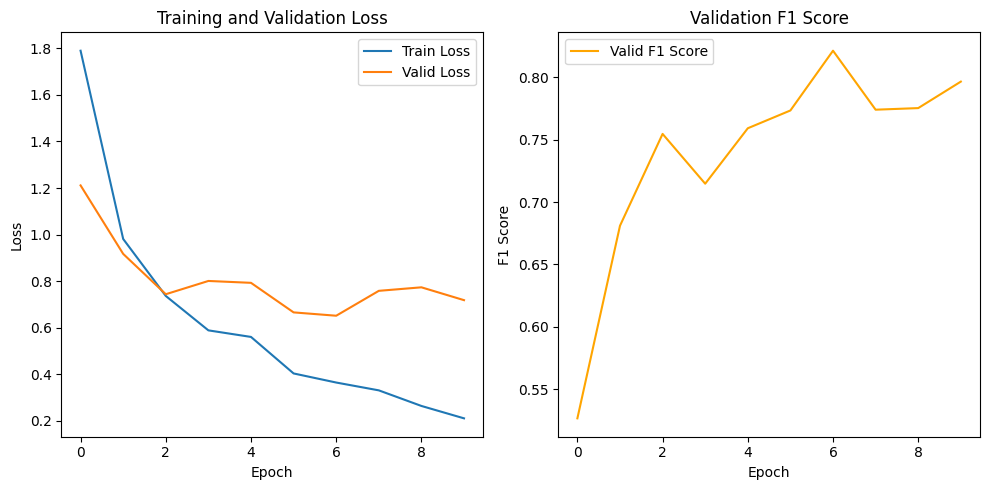

In [ ]:
# Plot the training and validation metrics
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(np.arange(CONFIG['epochs']), train_losses, label='Train Loss')
plt.plot(np.arange(CONFIG['epochs']), valid_losses, label='Valid Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(np.arange(CONFIG['epochs']), valid_f1_scores, label='Valid F1 Score', color='orange')
plt.title('Validation F1 Score')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend()

plt.tight_layout()
plt.show()

# Model Testing

100%|██████████| 37/37 [00:26<00:00,  1.41it/s]




Testing Report: -

              precision    recall  f1-score   support

     combuz1       0.71      0.73      0.72        30
      comsan       0.77      0.81      0.79        37
      woosan       0.91      0.95      0.93        43
     eaywag1       0.72      0.79      0.75        29
     eubeat1       0.85      0.81      0.83        42
     cohmar1       0.93      0.82      0.87        34
      barswa       0.92      0.88      0.90        40
      litegr       0.78      0.78      0.78        41

    accuracy                           0.83       296
   macro avg       0.82      0.82      0.82       296
weighted avg       0.83      0.83      0.83       296



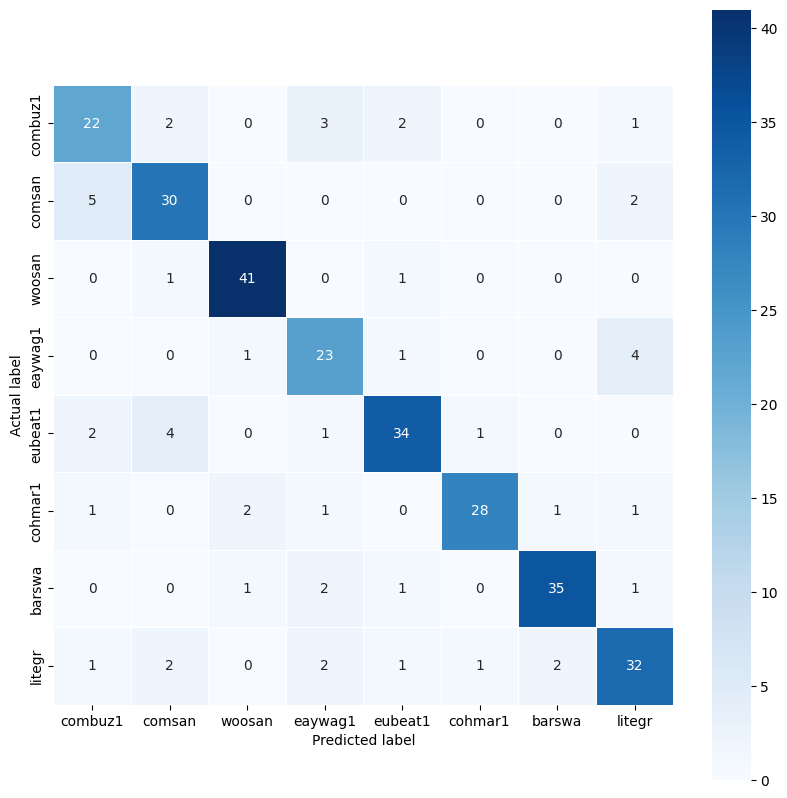

In [ ]:
test_dataset = BirdCLEFDataset(df_testing, target_sample_rate=CONFIG['sample_rate'])

test_loader = DataLoader(test_dataset, batch_size=CONFIG['batch_size'],num_workers=2,
                         shuffle=True, pin_memory=True, drop_last=True)

test(model, test_loader, device)